project 12--real world OBJECT DETECTION TASK and Image Super-Resolution using U-Net

# Haar Cascades

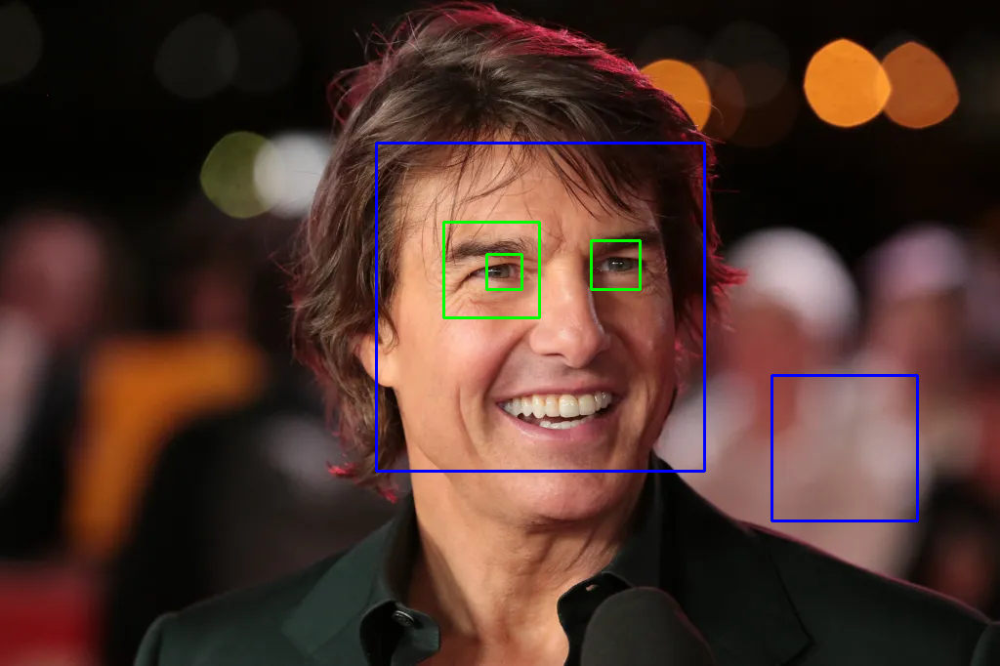

In [ ]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow


face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
eye_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_eye.xml')
img = cv2.imread("/content/image.jpeg.webp")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
faces = face_cascade.detectMultiScale(gray, 1.2, 1)


for (x,y,w,h) in faces:
    img = cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
    roi_gray = gray[y:y+h, x:x+w]
    roi_color = img[y:y+h, x:x+w]
    eyes = eye_cascade.detectMultiScale(roi_gray)
    for (ex,ey,ew,eh) in eyes:
        cv2.rectangle(roi_color,(ex,ey),(ex+ew,ey+eh),(0,255,0),2)

cv2_imshow(img)

# Playing with Yolo v8

In [ ]:
!pip install ultralytics

import ultralytics
ultralytics.checks()

Ultralytics 8.3.218 🚀 Python-3.12.12 torch-2.8.0+cu126 CPU (Intel Xeon CPU @ 2.20GHz)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 39.5/107.7 GB disk)


### 1. Predict

In [ ]:
!yolo predict model=yolov8n.pt source='https://ultralytics.com/images/zidane.jpg'

Ultralytics 8.3.218 🚀 Python-3.12.12 torch-2.8.0+cu126 CPU (Intel Xeon CPU @ 2.20GHz)
YOLOv8n summary (fused): 72 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs

image 1/1 /content/zidane.jpg: 384x640 2 persons, 1 tie, 1115.3ms
Speed: 32.0ms preprocess, 1115.3ms inference, 83.7ms postprocess per image at shape (1, 3, 384, 640)
Results saved to /content/runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


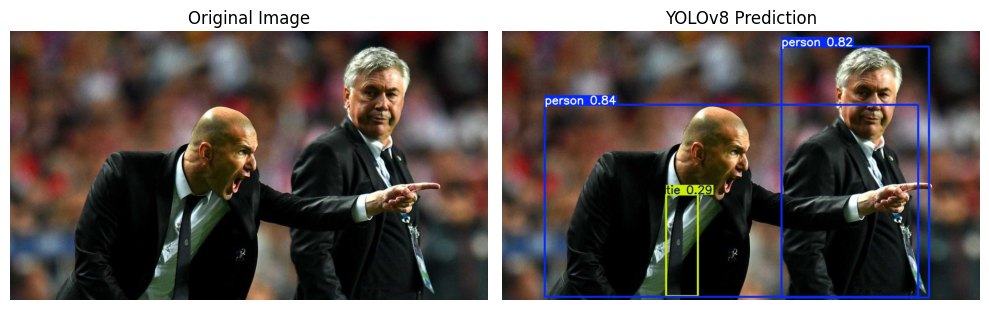

In [ ]:
import matplotlib.pyplot as plt

img1 = cv2.imread("zidane.jpg")
img2 = cv2.imread("/content/runs/detect/predict/zidane.jpg")

img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Display the images in the subplots
axes[0].imshow(img1_rgb)
axes[0].set_title("Original Image")
axes[0].axis('off') # Hide axes

axes[1].imshow(img2_rgb)
axes[1].set_title("YOLOv8 Prediction")
axes[1].axis('off') # Hide axes

plt.tight_layout() # Adjust layout to prevent overlapping titles
plt.show()

In [ ]:
from ultralytics import YOLO
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

# Load the YOLOv8 model
model = YOLO('yolov8n.pt')

# Open the default camera
cap = cv2.VideoCapture(0)

# Check if camera opened successfully
if not cap.isOpened():
    print("Error: Could not open camera.")
else:
    while True:
        # Read a frame from the camera
        ret, frame = cap.read()

        # If frame is read correctly ret is True
        if not ret:
            print("Error: Can't receive frame (stream end?). Exiting ...")
            break

        # Perform object detection on the frame
        results = model(frame, verbose=False) # Set verbose=False to reduce output

        # Annotate the frame with detection results
        annotated_frame = results[0].plot()

        # Display the annotated frame
        cv2_imshow(annotated_frame)

        # Break the loop if 'q' is pressed
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

    # Release the capture and destroy all windows
    cap.release()
    cv2.destroyAllWindows()

Error: Could not open camera.


camera is not working because of google collab

# Image Super-Resolution using U-Net

This notebook demonstrates how to build and train a U-Net model for image super-resolution. The goal is to take a low-resolution image (64x64) and generate a high-resolution version (256x256).

The U-Net architecture is well-suited for this task as it effectively captures both local and global features through its encoder-decoder structure with skip connections.

### Setup and Imports

This cell imports all the necessary libraries for building and training the U-Net model, including Keras for model definition, OpenCV for image processing, and Matplotlib for visualization.

In [ ]:
import os
import cv2 as cv
import numpy as np

import matplotlib.pyplot as plt

from keras.models import Model, load_model
from keras.layers import Input, BatchNormalization, Activation, Dense, Dropout
from keras.layers import Conv2D, Conv2DTranspose
from keras.layers import MaxPooling2D, GlobalMaxPool2D
from keras.layers import concatenate
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from keras.optimizers import Adam
import tensorflow as tf


### U-Net Model Definition

This cell defines the U-Net model architecture for image super-resolution. The unet_64to256 function creates a U-Net model that takes a 64x64x3 image as input and outputs a 256x256x3 image. It includes an encoder, a bottleneck, and a decoder with skip connections.

In [ ]:
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, MaxPooling2D, Dropout, BatchNormalization, Activation, concatenate
from tensorflow.keras.models import Model

def unet_64to256(input_shape=(64, 64, 3), n_classes=3, final_activation='sigmoid', dropout_rate=0.05):
    inputs = Input(shape=input_shape, name='img')

    # ---------------- Encoder ----------------
    c1 = Conv2D(16, (3,3), padding='same')(inputs)
    c1 = BatchNormalization()(c1); c1 = Activation('relu')(c1)
    c1 = Conv2D(16, (3,3), padding='same')(c1)
    c1 = BatchNormalization()(c1); c1 = Activation('relu')(c1)
    p1 = MaxPooling2D((2,2))(c1); p1 = Dropout(dropout_rate)(p1)   # 64 -> 32

    c2 = Conv2D(32, (3,3), padding='same')(p1)
    c2 = BatchNormalization()(c2); c2 = Activation('relu')(c2)
    c2 = Conv2D(32, (3,3), padding='same')(c2)
    c2 = BatchNormalization()(c2); c2 = Activation('relu')(c2)
    p2 = MaxPooling2D((2,2))(c2); p2 = Dropout(dropout_rate)(p2)   # 32 -> 16

    c3 = Conv2D(64, (3,3), padding='same')(p2)
    c3 = BatchNormalization()(c3); c3 = Activation('relu')(c3)
    c3 = Conv2D(64, (3,3), padding='same')(c3)
    c3 = BatchNormalization()(c3); c3 = Activation('relu')(c3)
    p3 = MaxPooling2D((2,2))(c3); p3 = Dropout(dropout_rate)(p3)   # 16 -> 8

    c4 = Conv2D(128, (3,3), padding='same')(p3)
    c4 = BatchNormalization()(c4); c4 = Activation('relu')(c4)
    c4 = Conv2D(128, (3,3), padding='same')(c4)
    c4 = BatchNormalization()(c4); c4 = Activation('relu')(c4)
    p4 = MaxPooling2D((2,2))(c4); p4 = Dropout(dropout_rate)(p4)   # 8 -> 4

    # ---------------- Bottleneck ----------------
    c5 = Conv2D(256, (3,3), padding='same')(p4)
    c5 = BatchNormalization()(c5); c5 = Activation('relu')(c5)
    c5 = Conv2D(256, (3,3), padding='same')(c5)
    c5 = BatchNormalization()(c5); c5 = Activation('relu')(c5)

    # ---------------- Decoder ----------------
    u6 = Conv2DTranspose(128, (3,3), strides=(2,2), padding='same')(c5)  # 4 -> 8
    u6 = concatenate([u6, c4]); u6 = Dropout(dropout_rate)(u6)
    u6 = Conv2D(128, (3,3), padding='same')(u6)
    u6 = BatchNormalization()(u6); u6 = Activation('relu')(u6)
    u6 = Conv2D(128, (3,3), padding='same')(u6)
    u6 = BatchNormalization()(u6); u6 = Activation('relu')(u6)

    u7 = Conv2DTranspose(64, (3,3), strides=(2,2), padding='same')(u6)    # 8 -> 16
    u7 = concatenate([u7, c3]); u7 = Dropout(dropout_rate)(u7)
    u7 = Conv2D(64, (3,3), padding='same')(u7)
    u7 = BatchNormalization()(u7); u7 = Activation('relu')(u7)
    u7 = Conv2D(64, (3,3), padding='same')(u7)
    u7 = BatchNormalization()(u7); u7 = Activation('relu')(u7)

    u8 = Conv2DTranspose(32, (3,3), strides=(2,2), padding='same')(u7)    # 16 -> 32
    u8 = concatenate([u8, c2]); u8 = Dropout(dropout_rate)(u8)
    u8 = Conv2D(32, (3,3), padding='same')(u8)
    u8 = BatchNormalization()(u8); u8 = Activation('relu')(u8)
    u8 = Conv2D(32, (3,3), padding='same')(u8)
    u8 = BatchNormalization()(u8); u8 = Activation('relu')(u8)

    u9 = Conv2DTranspose(16, (3,3), strides=(2,2), padding='same')(u8)    # 32 -> 64
    u9 = concatenate([u9, c1]); u9 = Dropout(dropout_rate)(u9)
    u9 = Conv2D(16, (3,3), padding='same')(u9)
    u9 = BatchNormalization()(u9); u9 = Activation('relu')(u9)
    u9 = Conv2D(16, (3,3), padding='same')(u9)
    u9 = BatchNormalization()(u9); u9 = Activation('relu')(u9)

    # ---------------- Extra Upsample to 128 ----------------
    u10 = Conv2DTranspose(16, (3,3), strides=(2,2), padding='same')(u9)   # 64 -> 128
    u10 = Dropout(dropout_rate)(u10)
    u10 = Conv2D(16, (3,3), padding='same')(u10)
    u10 = BatchNormalization()(u10); u10 = Activation('relu')(u10)

    # ---------------- Extra Upsample to 256 ----------------
    u11 = Conv2DTranspose(16, (3,3), strides=(2,2), padding='same')(u10)  # 128 -> 256
    u11 = Dropout(dropout_rate)(u11)
    u11 = Conv2D(16, (3,3), padding='same')(u11)
    u11 = BatchNormalization()(u11); u11 = Activation('relu')(u11)

    outputs = Conv2D(n_classes, (1,1), activation=final_activation, name='mask')(u11)

    return Model(inputs=inputs, outputs=outputs, name='UNet_64to256')


## Model Initialization and Compilation

This cell initializes the U-Net model with the specified input shape and number of classes. It then compiles the model using the Adam optimizer and mean absolute error (MAE) as the loss function. The input and output shapes are printed to verify the model architecture.

In [ ]:
from tensorflow.keras.optimizers import Adam

# Initialize the U-Net model for 64 -> 256 super-resolution
model = unet_64to256(input_shape=(64,64,3), n_classes=3, final_activation='sigmoid')

# Print input and output shapes to verify
print('Input shape:', model.input_shape)   # (None, 64, 64, 3)
print('Output shape:', model.output_shape) # (None, 256, 256, 3)

# Compile the model
model.compile(
    optimizer=Adam(1e-4),
    loss='mae'   # Mean Absolute Error
)


Input shape: (None, 64, 64, 3)
Output shape: (None, 256, 256, 3)


### Data Generator

This cell defines a data generator function `datagen` that loads and preprocesses images from the CelebA dataset. It resizes the images to 256x256 as ground truth and to 64x64 as low-resolution input, and normalizes the pixel values. The generator yields batches of low-resolution and high-resolution image pairs for training.

In [ ]:
!pip install kaggle


In [ ]:
from google.colab import files
files.upload()  # This will open a file chooser to upload kaggle.json


Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"sushantk21ai","key":"d355b03ba0c5d38129e1617b55b25097"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


In [ ]:
!kaggle datasets download -d jessicali9530/celeba-dataset


Dataset URL: https://www.kaggle.com/datasets/jessicali9530/celeba-dataset
License(s): other
 97% 1.29G/1.33G [00:14<00:00, 78.4MB/s]
100% 1.33G/1.33G [00:14<00:00, 97.9MB/s]


In [ ]:
!unzip celeba-dataset.zip -d celeba_data


Streaming output truncated to the last 5000 lines.
  inflating: celeba_data/img_align_celeba/img_align_celeba/197605.jpg  
  inflating: celeba_data/img_align_celeba/img_align_celeba/197606.jpg  
  inflating: celeba_data/img_align_celeba/img_align_celeba/197607.jpg  
  inflating: celeba_data/img_align_celeba/img_align_celeba/197608.jpg  
  inflating: celeba_data/img_align_celeba/img_align_celeba/197609.jpg  
  inflating: celeba_data/img_align_celeba/img_align_celeba/197610.jpg  
  inflating: celeba_data/img_align_celeba/img_align_celeba/197611.jpg  
  inflating: celeba_data/img_align_celeba/img_align_celeba/197612.jpg  
  inflating: celeba_data/img_align_celeba/img_align_celeba/197613.jpg  
  inflating: celeba_data/img_align_celeba/img_align_celeba/197614.jpg  
  inflating: celeba_data/img_align_celeba/img_align_celeba/197615.jpg  
  inflating: celeba_data/img_align_celeba/img_align_celeba/197616.jpg  
  inflating: celeba_data/img_align_celeba/img_align_celeba/197617.jpg  
  inflating: 

In [ ]:
import os
import cv2 as cv
import numpy as np

# List all image files in the CelebA dataset
imgs = os.listdir('/content/celeba_data/img_align_celeba/img_align_celeba/')

def datagen(batch_size):
    """
    Yields batches of low-resolution (64x64) and high-resolution (256x256) images.
    """
    while True:
        x_batch = []
        y_batch = []

        for _ in range(batch_size):
            indx = np.random.randint(0, len(imgs))

            # Load image
            bgr = cv.imread('/content/celeba_data/img_align_celeba/img_align_celeba/' + imgs[indx])
            bgr = cv.resize(bgr, (256, 256))       # High-resolution target
            rgb = cv.cvtColor(bgr, cv.COLOR_BGR2RGB)

            # Low-resolution input
            x = cv.resize(rgb, (64, 64))
            x = x / 255.0

            # High-resolution target
            y = rgb / 255.0

            x_batch.append(x)
            y_batch.append(y)

        # Convert lists to NumPy arrays
        x_batch = np.array(x_batch).reshape(batch_size, 64, 64, 3)
        y_batch = np.array(y_batch).reshape(batch_size, 256, 256, 3)

        yield x_batch, y_batch


### Model Training (Short Run)

This cell trains the U-Net model for a small number of epochs (5) using the `datagen` function. This is a short run to quickly check if the model is training without errors.

In [ ]:
batch_size = 32

batch_size = 32
num_images = len(imgs)
steps_per_epoch = num_images // batch_size


results = model.fit(datagen(batch_size=batch_size), steps_per_epoch=steps_per_epoch , epochs=5, verbose=1)

Epoch 1/5
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 758s 113ms/step - loss: 0.0650
Epoch 2/5
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 716s 113ms/step - loss: 0.0313
Epoch 3/5
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 716s 113ms/step - loss: 0.0292
Epoch 4/5
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 714s 113ms/step - loss: 0.0283
Epoch 5/5
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 713s 113ms/step - loss: 0.0275


### Model Training with Callbacks and Sample Saving

This cell trains the U-Net model for a longer duration (3 epochs) and includes custom callbacks. The `show_and_save_samples` function generates and saves sample super-resolved images at the end of each epoch, along with the original, ground truth, and low-resolution images for comparison. The `LambdaCallback` is used to execute this function after each epoch. The model checkpoints are also saved during training.

Epoch 1/3
12662/12662 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0287

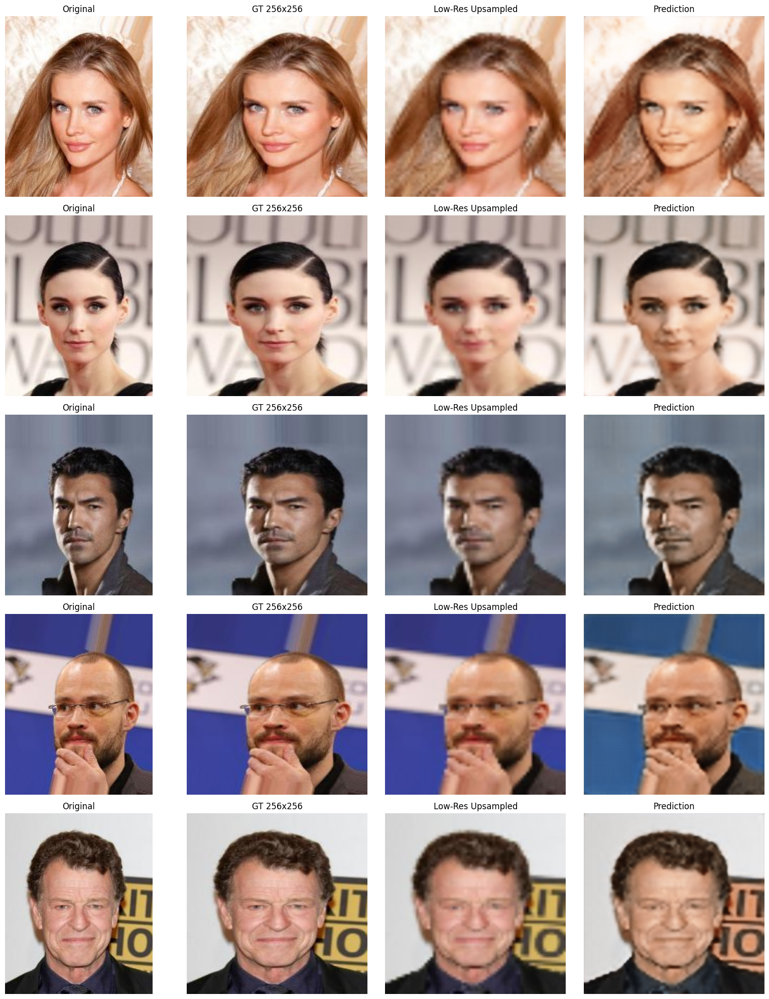

12662/12662 ━━━━━━━━━━━━━━━━━━━━ 761s 58ms/step - loss: 0.0287
Epoch 2/3
12662/12662 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0278

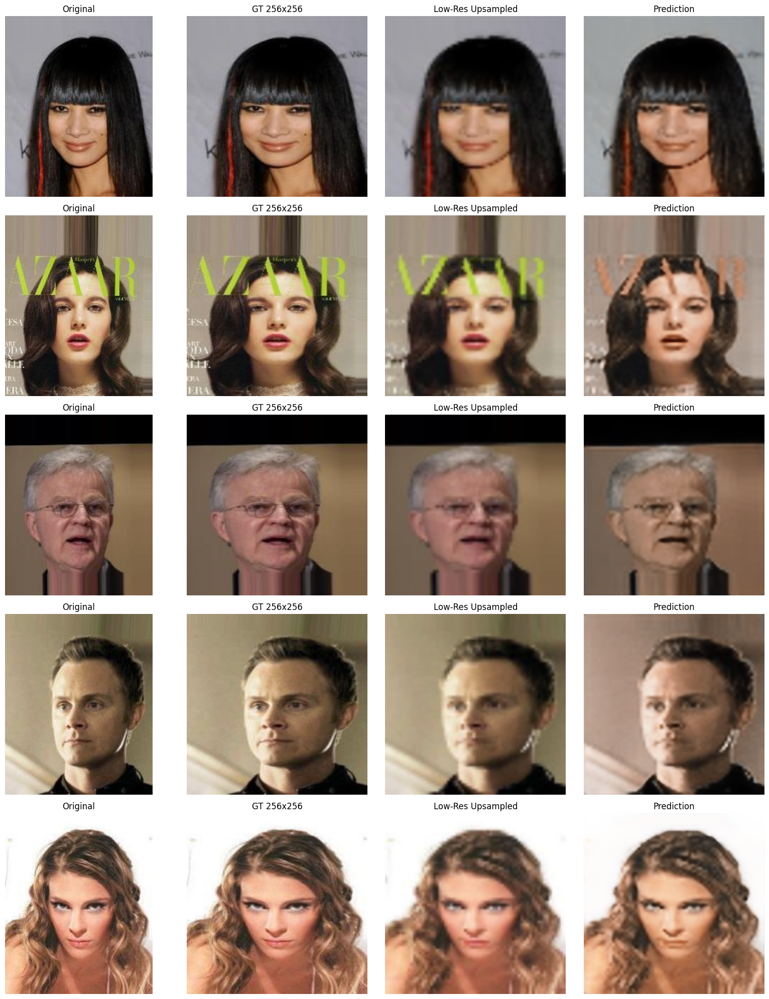

12662/12662 ━━━━━━━━━━━━━━━━━━━━ 831s 66ms/step - loss: 0.0278
Epoch 3/3
12662/12662 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0272

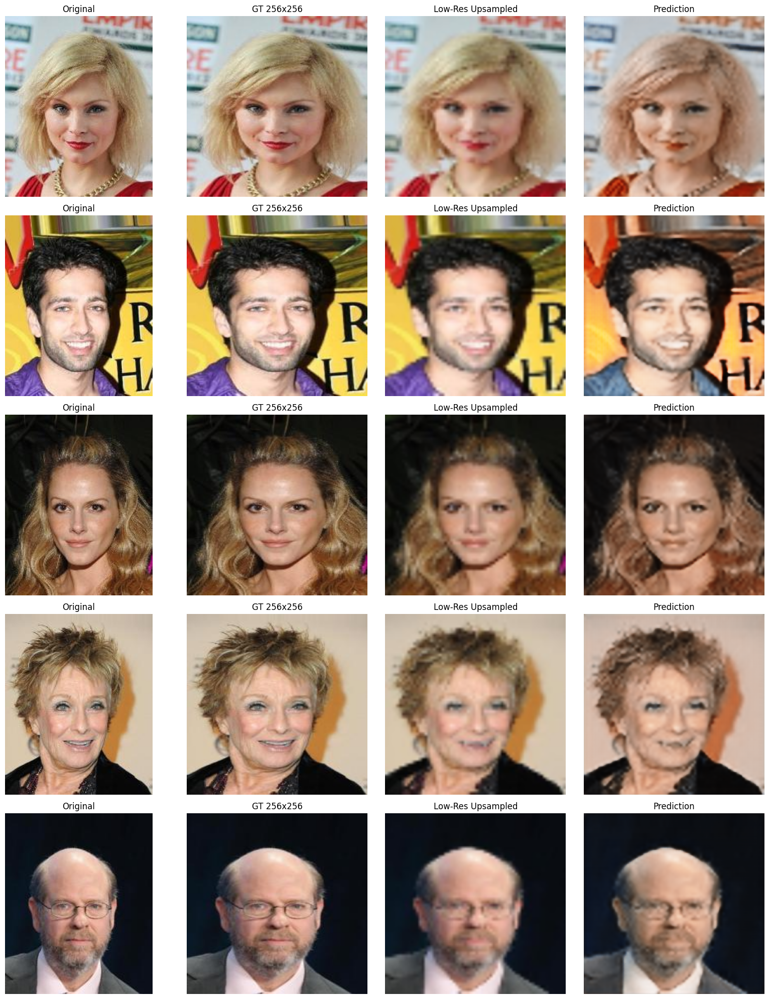

12662/12662 ━━━━━━━━━━━━━━━━━━━━ 836s 66ms/step - loss: 0.0272


In [ ]:
import os, cv2 as cv, numpy as np, matplotlib.pyplot as plt, tensorflow as tf

def show_and_save_samples(model, imgs, base_dir, epoch, n=5, save_dir='./epoch_samples'):
    """
    Generate and save super-resolved samples (64->256) at the end of each epoch.
    """
    os.makedirs(save_dir, exist_ok=True)
    chosen = np.random.choice(imgs, n, replace=False)
    fig, axes = plt.subplots(n, 4, figsize=(16, 4*n))
    if n == 1: axes = np.expand_dims(axes, 0)

    for i, fname in enumerate(chosen):
        path = os.path.join(base_dir, fname)
        rgb = cv.cvtColor(cv.imread(path), cv.COLOR_BGR2RGB)

        # High-res ground truth 256x256
        gt256 = cv.resize(rgb, (256,256)).astype('float32')/255

        # Low-res input 64x64
        img64 = cv.resize(rgb, (64,64)).astype('float32')/255

        # Model prediction (super-resolved)
        pred = model.predict(np.expand_dims(img64,0), verbose=0)[0]

        # Upsampled low-res for comparison
        lowup = cv.resize((img64*255).astype(np.uint8), (256,256))

        for ax, im, title in zip(axes[i],[rgb, gt256, lowup, pred],
                                 ['Original','GT 256x256','Low-Res Upsampled','Prediction']):
            ax.imshow(im); ax.set_title(title); ax.axis('off')

    plt.tight_layout()
    plt.savefig(f"{save_dir}/epoch_{epoch+1:02d}.png")
    plt.show()

# --- Lambda Callback ---
def on_epoch_end(epoch, logs):
    show_and_save_samples(model, imgs, base_dir, epoch, n=5)
    model.save(f'./checkpoints/model_epoch_{epoch+1:02d}.keras')

show_cb = tf.keras.callbacks.LambdaCallback(on_epoch_end=on_epoch_end)

# --- Training Setup ---
batch_size = 16   # Reduce if memory issues occur
steps_per_epoch = len(imgs)//batch_size
base_dir = '/content/celeba_data/img_align_celeba/img_align_celeba/'
os.makedirs('./checkpoints', exist_ok=True)

# --- Model Training ---
results = model.fit(
    datagen(batch_size=batch_size),
    steps_per_epoch=steps_per_epoch,
    epochs=3,
    callbacks=[show_cb],
    verbose=1
)


# Project Summary

This notebook successfully implemented and trained a U-Net model for image super-resolution. The model was trained on the CelebA dataset, taking 64x64 images as input and generating 256x256 images.

The training process showed a decrease in the mean absolute error (MAE) loss over epochs, indicating that the model is learning to reconstruct higher-resolution images. The generated sample images at the end of each epoch provide a visual representation of the model's progress.

Further improvements could include:
- Experimenting with different loss functions (e.g., perceptual loss)
- Using a larger and more diverse dataset
- Implementing more advanced super-resolution techniques (e.g., Generative Adversarial Networks)
- Hyperparameter tuning to optimize model performance